# Stile di Vita e Felicità
## Un’indagine esplorativa sui fattori che influenzano il benessere 
#### Kristian Boldini, Maria Grazia Corino, Ahmed El Aidy - Gruppo B

## Introduzione

Il progetto si propone di esaminare quali sono i fattori legati allo stile di vita che tendono a incidere maggiormente sulla percezione della felicità da parte di un individuo.

## Informazioni sul Dataset

Il dataset può essere scaricato da https://vincentarelbundock.github.io/Rdatasets/csv/wooldridge/happiness.csv

- Nome: "happiness"
- Origine: tratto da General Social Survey (GSS) negli Stati Uniti.
- Periodo: dati raccolti tra il 1994 e il 2006.
- Dimensioni: 17.137 osservazioni e 33 colonne.

Il dataset riporta il livello di felicità dichiarato dai partecipanti e una serie di variabili legate allo stile di vita, come istruzione, reddito, abitudini religiose, situazione lavorativa e prestigio occupazionale. Inoltre include informazioni su variabili demografiche come lo stato civile e l'etnia. L'analisi di questo dataset potrebbe suggerire quali tra i diversi aspetti dello stile di vita influenzano maggiormente la percezione della felicità nelle persone intervistate.

## Importazione Dati

In [1]:
import pandas as pd
import plotly.express as px
import plotly.graph_objs as go
import numpy as np
pd.set_option('display.max_columns', 100)

df = pd.read_csv('data/happiness.csv')

In [2]:
map_dict = {
    'middle atlantic': 'Middle Atlantic',
    'new england': 'New England',
    'pacific': 'Pacific',
    'south atlantic':'South Atlantic',
    'e. nor. central':'East North Central',
    'w. sou. central':'West South Central',
    'w. nor. central':'West North Central',
    'mountain':'Mountain',
    'e. sou. central':'East South Central'
}

# Usa la funzione replace per sostituire i valori
df['region'] = df['region'].replace(map_dict)


In [3]:
map_dict = {
    'never': 'never',
    'lt once a year': 'infrequent',
    'once a year': 'infrequent',
    '2-3x a month': 'frequent',
    'once a month': 'moderate',
    'more thn once wk': 'very frequent',
    'nrly every week': 'frequent',
    'every week': 'very frequent',
    'sevrl times a yr': 'moderate'
}

# Usa la funzione replace per sostituire i valori
df['attend_freq'] = df['attend'].replace(map_dict)

In [4]:
map_dict = {
    'never': 'never',
    'lt once a year': 'less than once a year',
    '2-3x a month': '2-3 times a month',
    'more thn once wk': 'more than once a week',
    'nrly every week': 'nearly every week',
    'sevrl times a yr': 'several times a year'
}

# Usa la funzione replace per sostituire i valori
df['attend'] = df['attend'].replace(map_dict)

In [5]:
# Define the bins (based on USA schooling system)
# inlcudes left value but excludes the right value.
bins = [0, 6, 9, 13, 15, 17, np.inf]
# Define the group names
group_names = ['Elementary School', 'Middle School', 'High School', 'College or Vocational Training', 'Bachelor\'s Degree', 'Postgraduate Education']
# Create a new column 'education_group'
df['education_group'] = pd.cut(df['educ'], bins, labels=group_names, include_lowest=True)

In [6]:
# Create a gender column
df['gender'] = df['female'].map({1: 'Female', 0: 'Male'})

# Create ethicity column
race_dict = {0: 'White', 1: 'Black'}
df['ethnicity'] = df['black'].map(race_dict)

In [7]:
map_dict = {
    'keeping house': 'Housewife/husband',
    'working fulltime': 'Full-Time',
    'working parttime': 'Part-Time',
    'unempl, laid off': 'Unemployed',
    'temp not working': 'Unemployed',
    'school': 'Student',
    'retired' : 'Retired',
    'other':"Other"
}
df['workstat'] = df['workstat'].replace(map_dict)
df

,rownames,year,workstat,prestige,divorce,widowed,educ,reg16,babies,preteen,teens,income,region,attend,happy,owngun,tvhours,vhappy,mothfath16,black,gwbush04,female,blackfemale,gwbush00,occattend,regattend,y94,y96,y98,y00,y02,y04,y06,unem10,attend_freq,education_group,gender,ethnicity
0,1,1994,Housewife/husband,46.0,NaN,iap,12.0,middle atlantic,2.0,3.0,0.0,$10000 - 14999,Middle Atlantic,several times a year,pretty happy,NaN,2.0,0,1.0,1,NaN,1,1,NaN,1.0,0.0,1,0,0,0,0,0,0,1.0,moderate,High School,Female,Black
1,2,1994,Full-Time,22.0,no,iap,12.0,foreign,0.0,0.0,0.0,NaN,Middle Atlantic,every week,very happy,NaN,3.0,1,0.0,1,NaN,0,0,NaN,0.0,0.0,1,0,0,0,0,0,0,0.0,very frequent,High School,Male,Black
2,3,1994,Full-Time,29.0,no,iap,12.0,foreign,0.0,0.0,0.0,$15000 - 19999,Middle Atlantic,more than once a week,pretty happy,iap,1.0,0,0.0,1,NaN,1,1,NaN,0.0,1.0,1,0,0,0,0,0,0,NaN,very frequent,High School,Female,Black
3,4,1994,Full-Time,42.0,yes,iap,8.0,foreign,0.0,0.0,0.0,$15000 - 19999,Middle Atlantic,once a year,not too happy,NaN,3.0,0,0.0,0,NaN,0,0,NaN,0.0,0.0,1,0,0,0,0,0,0,1.0,infrequent,Middle School,Male,White
4,5,1994,Part-Time,36.0,NaN,NaN,13.0,middle atlantic,0.0,1.0,1.0,$10000 - 14999,Middle Atlantic,once a year,not too happy,iap,NaN,0,0.0,1,NaN,1,1,NaN,0.0,0.0,1,0,0,0,0,0,0,0.0,infrequent,High School,Female,Black
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17132,17133,2006,Housewife/husband,29.0,NaN,NaN,9.0,mountain,0.0,0.0,0.0,$3000 to 3999,Pacific,less than once a year,pretty happy,iap,1.0,0,0.0,0,NaN,1,0,NaN,0.0,0.0,0,0,0,0,0,0,1,NaN,infrequent,Middle School,Female,White
17133,17134,2006,Unemployed,51.0,NaN,iap,16.0,e. nor. central,0.0,1.0,1.0,$25000 or more,Pacific,once a month,pretty happy,NaN,1.0,0,1.0,0,1.0,0,0,1.0,1.0,0.0,0,0,0,0,0,0,1,0.0,moderate,Bachelor's Degree,Male,White
17134,17135,2006,Retired,NaN,yes,NaN,8.0,mountain,0.0,0.0,0.0,$6000 to 6999,Mountain,never,pretty happy,NaN,4.0,0,1.0,0,NaN,1,0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,never,Middle School,Female,White
17135,17136,2006,Housewife/husband,20.0,no,iap,6.0,foreign,1.0,2.0,1.0,$6000 to 6999,Mountain,every week,not too happy,NaN,8.0,0,1.0,0,NaN,1,0,NaN,0.0,0.0,0,0,0,0,0,0,1,1.0,very frequent,Elementary School,Female,White


## Profilo dei Partecipanti al Sondaggio

Per meglio contestualizzare le analisi presentate, si offre innanzitutto una panoramica sulla natura delle osservazioni incluse nel dataset.

I partecipanti al sondaggio sono per una leggera maggioranza di genere femminile, prevalentemente di origine bianca con una presenza minoritaria di origine afroamericana. Il numero di osservazioni annuali é costante, ad eccezione degli anni 2002 e 2004 dove il numero si dimezza per cause sconosciute. 

Il General Social Survey (GSS) utilizza un approccio trasversale, intervistando ogni due anni un nuovo campione nazionale rappresentativo, senza necessariamente ripetere gli stessi intervistati.

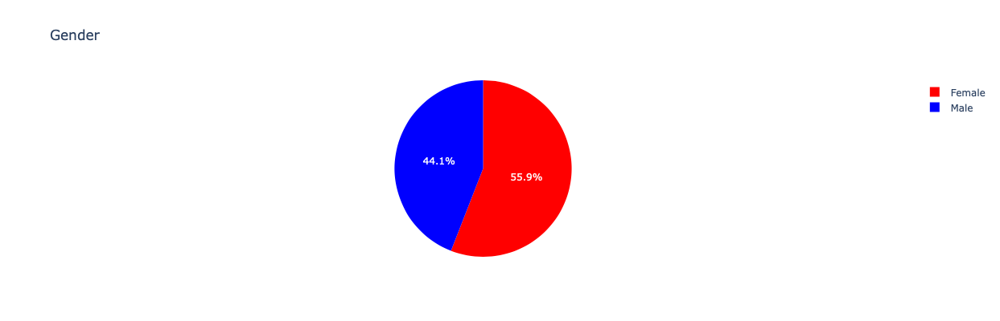

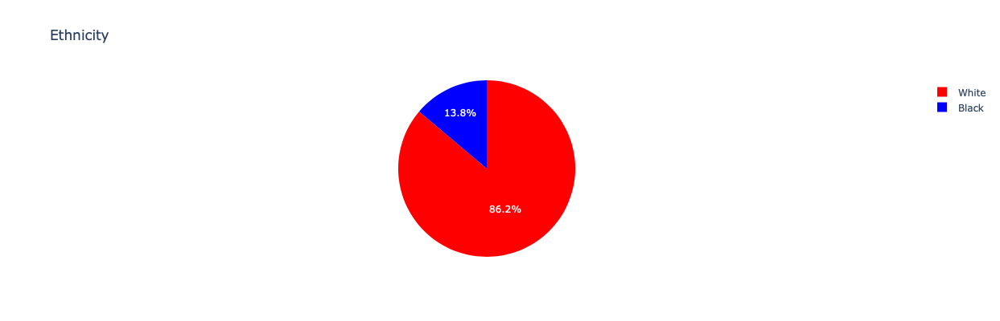

In [8]:
# Gender distribution
fig = px.pie(df, names='gender', title='Gender', color_discrete_sequence=['red', 'blue'])
fig.update_layout(width=400)
fig.update_layout(height=400)

fig.show()

# Ethnicity distribution
fig = px.pie(df, names='ethnicity', title='Ethnicity', color_discrete_sequence=['red', 'blue'])
fig.update_layout(width=400)
fig.update_layout(height=400)
fig.show()

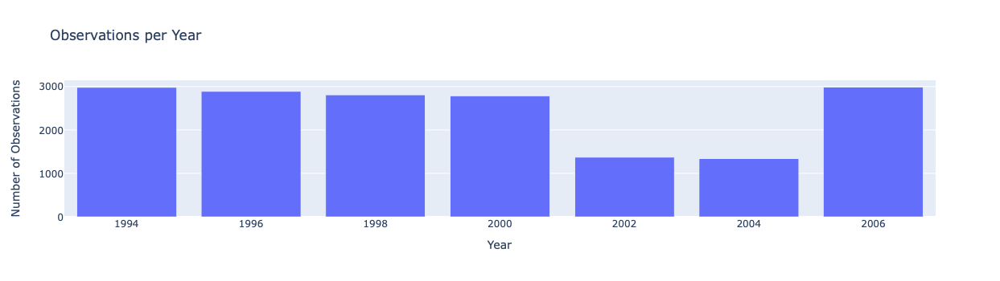

In [9]:
#Conta il numero di risposte per ogni anno
conteggio_per_anno = df['year'].value_counts()

conteggio_df = conteggio_per_anno.reset_index()
conteggio_df.columns = ['Year', 'Count']
conteggio_df = conteggio_df.sort_values(by='Year')
fig = px.bar(conteggio_df, x='Year', y='Count', labels={'Count': 'Number of Observations'}, title='Observations per Year')
fig.update_layout(width=900)
fig.update_layout(height=350)

fig.show()

## Analisi Esplorativa di Alcune Variabili Interessanti

Si effettua qui una prima analisi univariata di alcune variabili, per ottenere una visione d'insieme delle loro caratteristiche e distribuzioni.

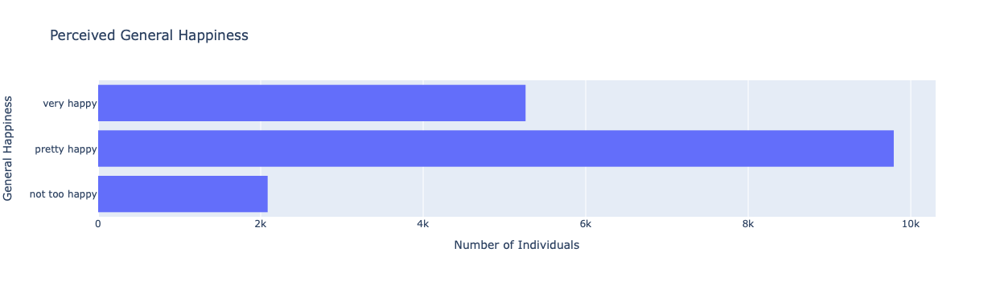

In [10]:
# general happiness
fig = px.histogram(df, y="happy", title="Perceived General Happiness")
fig.update_xaxes(title='Number of Individuals')
fig.update_yaxes(title='General Happiness', categoryorder="array", categoryarray=["not too happy","pretty happy", "very happy"])
fig.update_layout(height=350)
fig.show()

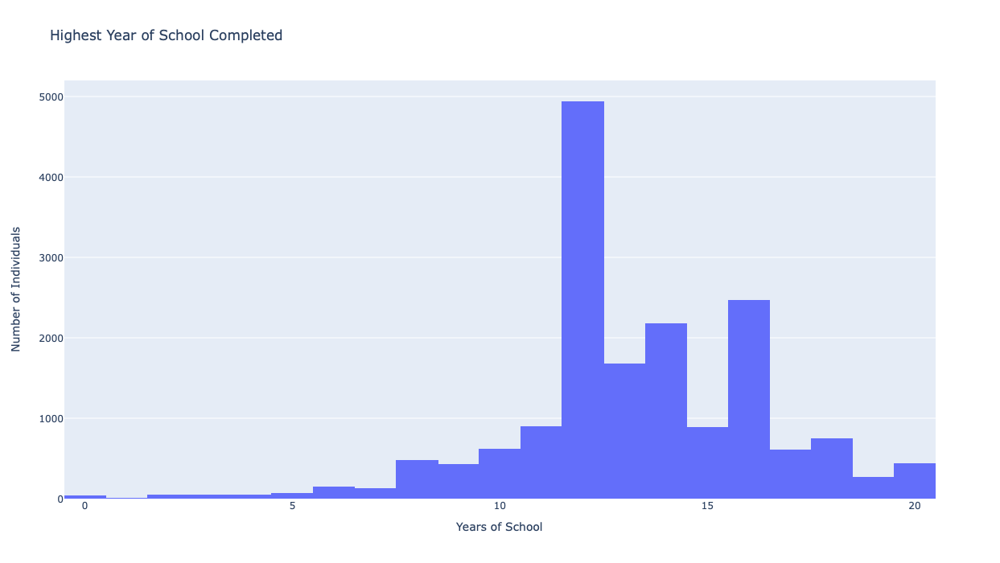

In [11]:
# highest year of school completed
fig = px.histogram(df, x='educ', title = "Highest Year of School Completed", height= 700, width=1000)
fig.update_yaxes(title='Number of Individuals')
fig.update_xaxes(title='Years of School')
fig.show()

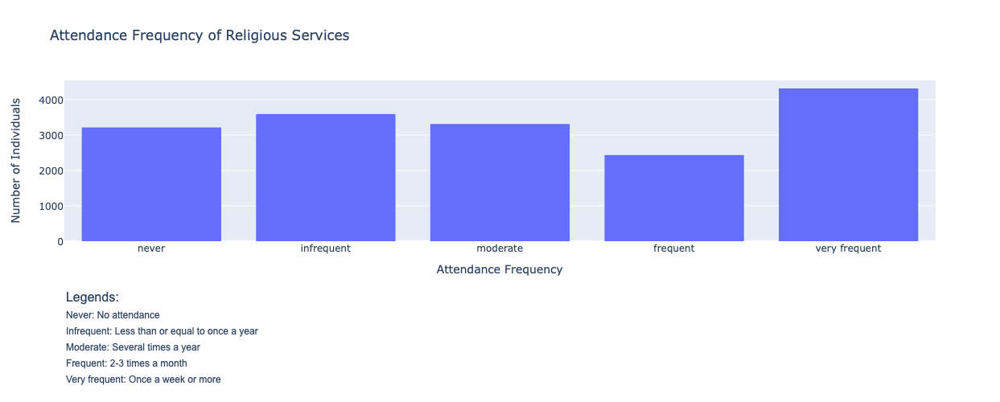

In [12]:
# how often attends religious services
attend_order = ['never', 'infrequent', 'moderate', 'frequent', 'very frequent']
fig = px.histogram(df, x='attend_freq', title = "Attendance Frequency of Religious Services", category_orders={"attend_freq": attend_order}, height=500)
fig.update_xaxes(title='Attendance Frequency')
fig.update_yaxes(title='Number of Individuals')


# annotations
annotations = []
annotations.append(dict(xref='paper', yref='paper', x=0.0, y=-0.40, xanchor='left', yanchor='bottom', text='Legends:', font=dict(family='Arial', size=16), showarrow=False))
annotations.append(dict(xref='paper', yref='paper', x=0.0, y=-0.50, xanchor='left', yanchor='bottom', text='Never: No attendance', font=dict(family='Arial', size=12), showarrow=False))
annotations.append(dict(xref='paper', yref='paper', x=0.0, y=-0.60, xanchor='left', yanchor='bottom', text='Infrequent: Less than or equal to once a year', font=dict(family='Arial', size=12), showarrow=False))
annotations.append(dict(xref='paper', yref='paper', x=0.0, y=-0.70, xanchor='left', yanchor='bottom', text='Moderate: Several times a year', font=dict(family='Arial', size=12), showarrow=False))
annotations.append(dict(xref='paper', yref='paper', x=0.0, y=-0.80, xanchor='left', yanchor='bottom', text='Frequent: 2-3 times a month', font=dict(family='Arial', size=12), showarrow=False))
annotations.append(dict(xref='paper', yref='paper', x=0.0, y=-0.90, xanchor='left', yanchor='bottom', text='Very frequent: Once a week or more', font=dict(family='Arial', size=12), showarrow=False))

fig.update_layout(annotations=annotations, margin=dict(b=200))
fig.show()

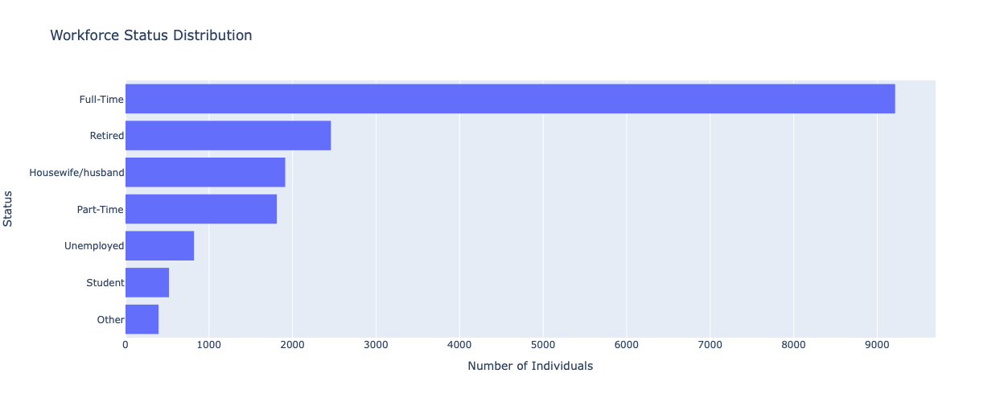

In [13]:
### work status distribution
fig = px.histogram(df, y='workstat',title = "Workforce Status Distribution", height= 500, width=800)
fig.update_xaxes(title='Number of Individuals')
fig.update_yaxes(title='Status', categoryorder='total ascending')
fig.show()

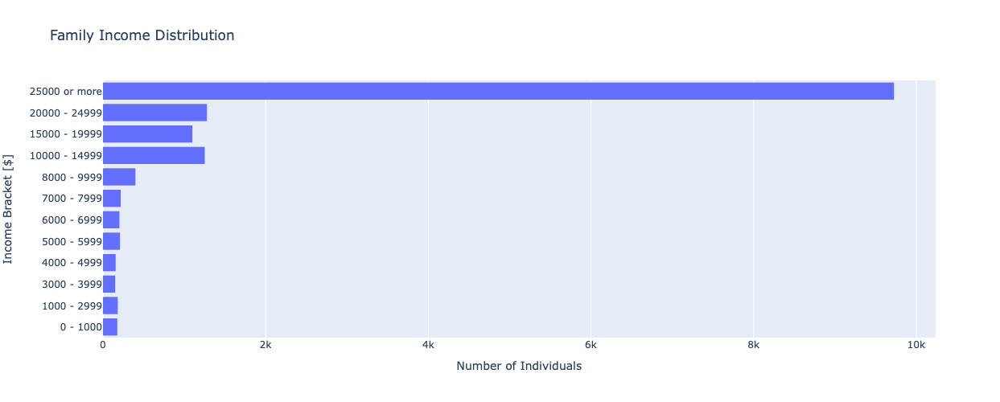

In [14]:
### total family income distribution
df['income'] = df['income'].str.replace('$', '').str.replace('to', '-').str.replace('lt','0 -').str.strip()
income_order = ['0 - 1000', '1000 - 2999', '3000 - 3999', '4000 - 4999', '5000 - 5999', '6000 - 6999', '7000 - 7999', '8000 - 9999', '10000 - 14999', '15000 - 19999', '20000 - 24999', '25000 or more']
income_order.reverse()
fig = px.histogram(df, y="income",title="Family Income Distribution", category_orders={"income": income_order}, height= 500, width=800)
fig.update_xaxes(title='Number of Individuals')
fig.update_yaxes(title='Income Bracket [$]')
fig.show()

# Lavoro e Istruzione

Il primo tema su cui si focalizzano le analisi é quello del mondo del lavoro, dell'istruzione e del prestigio associato all'occupazione lavorativa. Durante il periodo di osservazione la durata media dell'istruzione di un individuo é rimasta invariata.

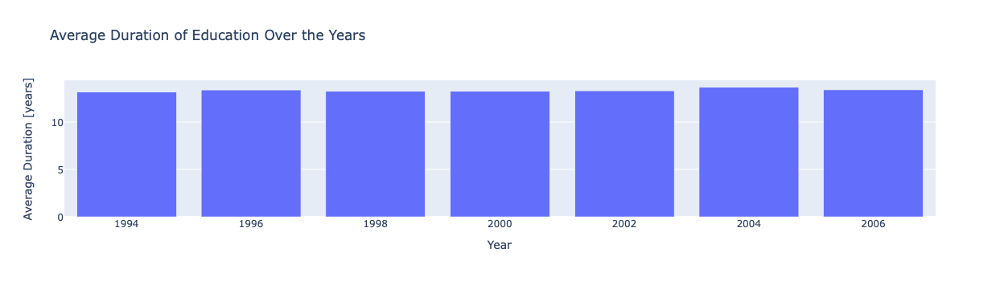

In [15]:
# Variation of education years average during the years
df_grouped = df.groupby('year')['educ'].mean().reset_index()
fig = px.bar(df_grouped, x='year', y='educ', title='Average Duration of Education Over the Years')
fig.update_xaxes(title='Year')
fig.update_yaxes(title='Average Duration [years]')
fig.update_layout(height=350)
fig.show()

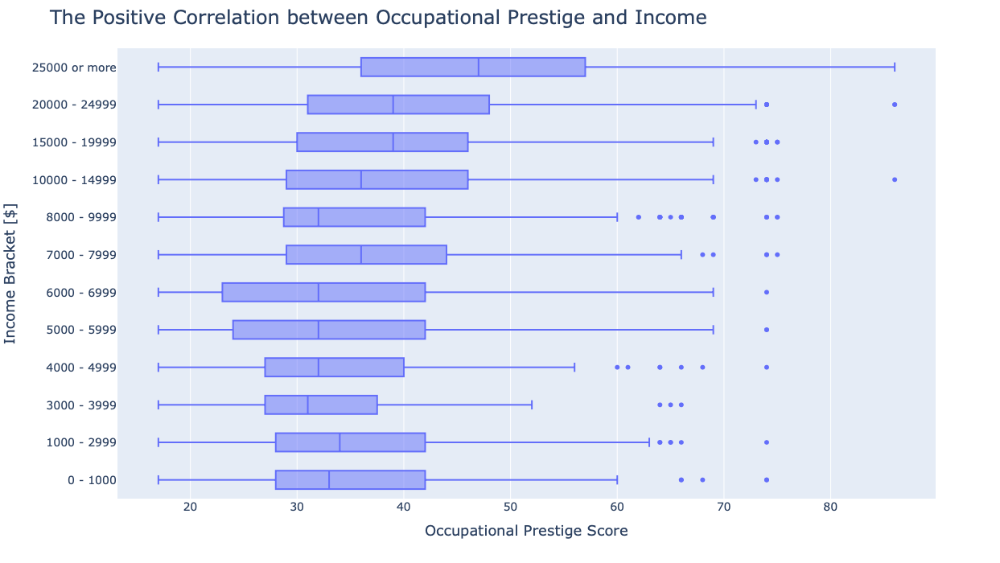

In [16]:
# Analysis of income vs prestige column
df['income'] = df['income'].str.replace('$', '').str.replace('to', '-').str.replace('lt','0 -').str.strip()
df_ip = df.dropna(subset=['income', 'prestige'])
income_order = ['0 - 1000', '1000 - 2999', '3000 - 3999', '4000 - 4999', '5000 - 5999', '6000 - 6999', '7000 - 7999', '8000 - 9999', '10000 - 14999', '15000 - 19999', '20000 - 24999', '25000 or more']
income_order.reverse()

fig = px.box(df_ip, x='prestige', y='income', category_orders={"income": income_order}, height= 800, width=1000)
fig.update_xaxes(title='Occupational Prestige Score', 
    title_font=dict(size=18),  
    tickfont=dict(size=14) )
fig.update_yaxes(title='Income Bracket [$]', 
    title_font=dict(size=18),  
    tickfont=dict(size=14) )

fig.update_layout(
    title=dict(
        text='The Positive Correlation between Occupational Prestige and Income',
        font=dict(size=24)  # Change the title font size here
    ),height=700
)

fig.show()


Il grafico mostra una correlazione positiva tra il reddito e il prestigio occupazionale, con il reddito che aumenta all’aumentare del prestigio.

L’ Occupational Prestige Score è una misura oggettiva utilizzata per quantificare il prestigio sociale associato a diverse occupazioni negli Stati Uniti. Si tratta di un modo quantitativo per valutare la percezione del ruolo o dell'importanza sociale di diverse professioni. 


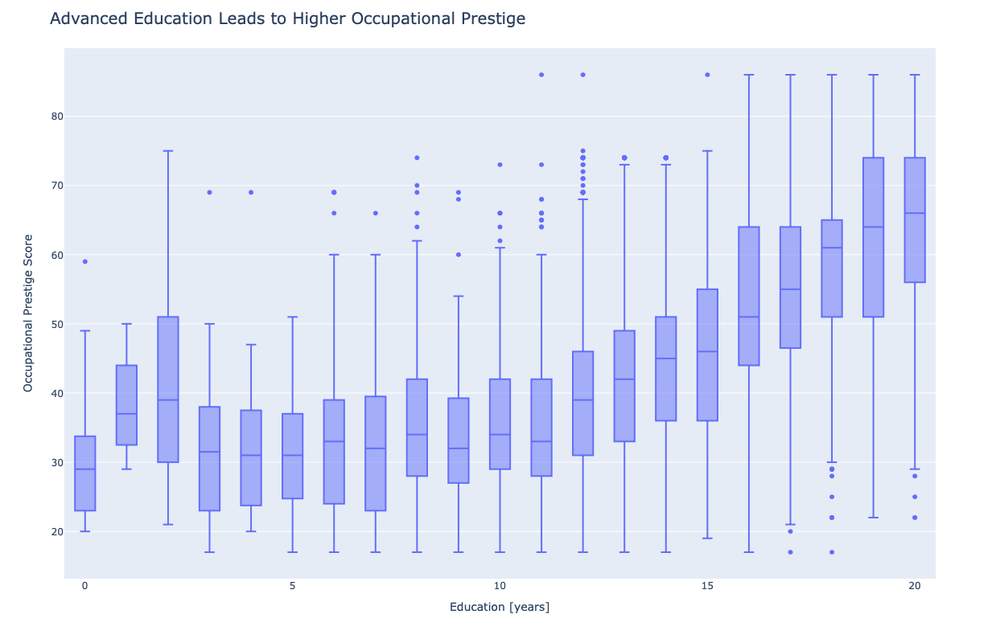

In [17]:
### Analysis of prestige vs education column
df_ie = df.dropna(subset=['prestige', 'educ'])

fig = px.box(df_ie, x='educ', y='prestige', height= 800, width=1100)
fig.update_xaxes(title='Education [years]')
fig.update_yaxes(title='Occupational Prestige Score')
fig.update_layout(
    title=dict(
        text='Advanced Education Leads to Higher Occupational Prestige',
        font=dict(size=20)  # Change the title font size here
    )
)

fig.show()

Parimenti, il prestigio sociale e lo status associato all'occupazione lavorativa tende ad aumentare più l'individuo é istruito.

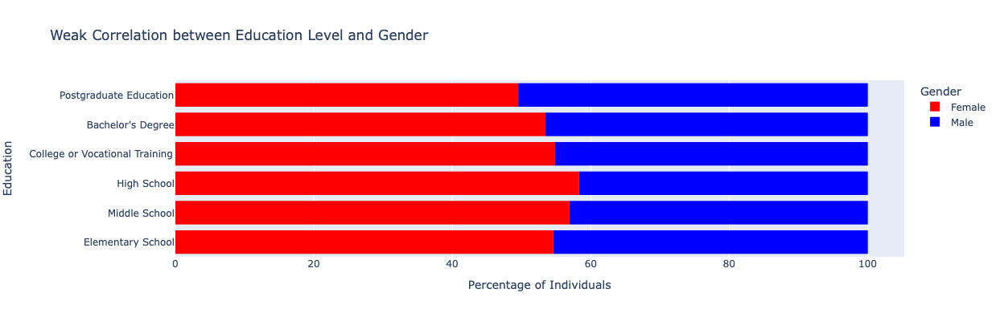

In [18]:
#"Education vs Gender"
df['gender'] = df['female'].map({1: 'Female', 0: 'Male'})
t = df.groupby(["education_group","female"], observed=False).size().unstack()

fig = px.histogram(df, orientation="h", y="education_group", color="gender", 
                   barmode="relative", barnorm="percent", 
                   category_orders={"education_group": group_names}, 
                   title="Weak Correlation between Education Level and Gender", color_discrete_map={'Male':'blue', 'Female':'red'})
fig.update_layout(xaxis_title="Percentage of Individuals", 
                  width=800, height=400)
fig.update_yaxes(title='Education')
fig.layout["legend"]["title"]["text"] = "Gender"
fig.layout["yaxis"]["autorange"] = "reversed"  # This line inverts the order of the y-axis
fig.show()

Il genere dei partecipanti al sondaggio sembra non influire in particolare modo sul livello di istruzione raggiunto.

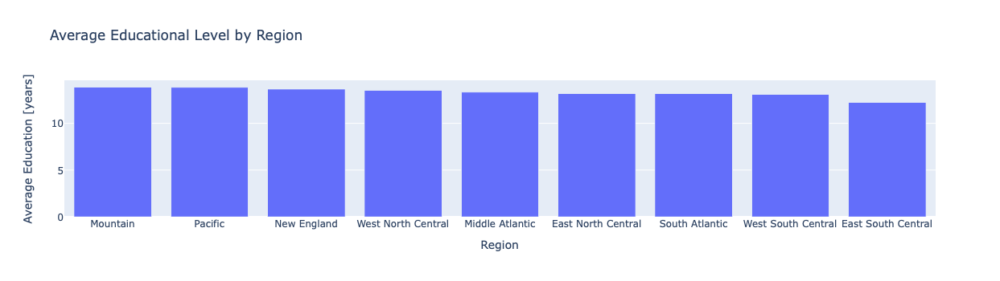

In [19]:
# livello di educazione medio in base alla regione
educ_analysis = df.groupby('region')['educ'].mean()
#print(educ_analysis)

fig = px.bar(educ_analysis,y='educ',title='Average Educational Level by Region')
fig.update_xaxes(title='Region', categoryorder='total descending')
fig.update_yaxes(title='Average Education [years]')
fig.update_layout(height=350)
fig.show()

Analizzando il livello di istruzione medio raggiunto dai partecipanti al sondaggio non emergono sostanziali disparità tra le varie regioni. 

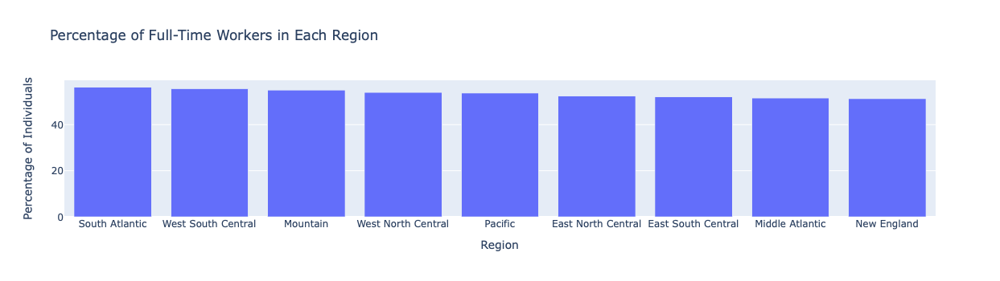

In [20]:
#Percentage of Full-Time Workers in each Region
fulltime_df = df[df['workstat'] == 'Full-Time']

region_counts = fulltime_df['region'].value_counts()

region_percentages = 100 * region_counts / df['region'].value_counts()

region_df = region_percentages.reset_index()
region_df.columns = ['region', 'percentage']

fig = px.bar(region_df, x='region', y='percentage', title='Percentage of Full-Time Workers in Each Region')
fig.update_xaxes(title='Region', categoryorder='total descending')
fig.update_yaxes(title='Percentage of Individuals')
fig.update_layout(height=350)
fig.show()


Riguardo alla percentuale di persone con impiego a tempo a tempo pieno, si osserva che la variazione nelle diverse regioni é minima.

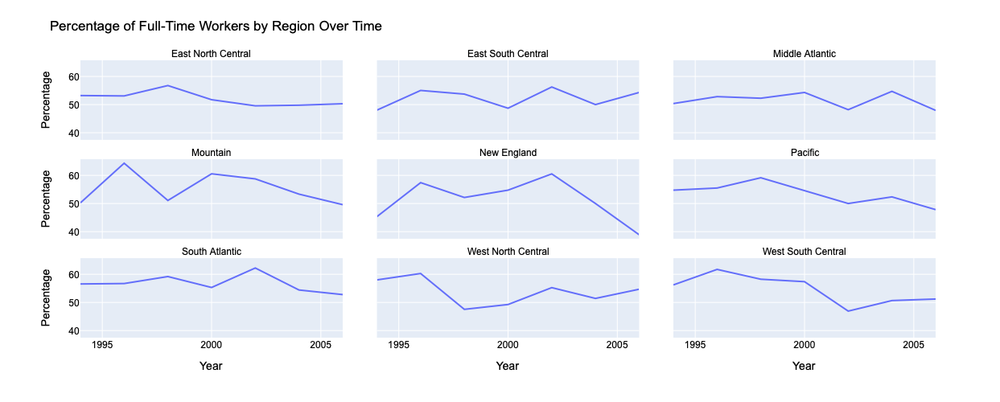

In [21]:
# Percentage of Full-Time Workers Over Time, by Region
#Creare una nuova colonna 'is_fulltime' che è 1 se 'workstat' è 'fulltime', altrimenti 0
df['is_fulltime'] = df['workstat'].apply(lambda x: 1 if x == 'Full-Time' else 0)

df_grouped = df.groupby(['year', 'region'])['is_fulltime'].mean().reset_index()
df_grouped['Full-Time'] = df_grouped['is_fulltime'] * 100  # Convertire in percentuale

#Creare un grafico a linee con faccette divise per regione
fig = px.line(df_grouped, x='year', y='Full-Time', facet_col='region', facet_col_wrap=3,facet_col_spacing=0.04,
              title='Percentage of Full-Time Workers by Region Over Time', labels={'year':'Year', 'Full-Time':'Percentage'})

#Aggiungere spazio tra le faccette
fig.update_layout(
                  autosize=True,
                  margin=dict(t=75,l=100),
                  font=dict(family='Arial', size=12, color='black'),
                  showlegend=False,
                  height=500)



#Rimuovere il prefisso "region = " dalle etichette delle faccette
for annotation in fig['layout']['annotations']: 
    annotation['text'] = annotation['text'].split('=')[1].strip()

fig.show()

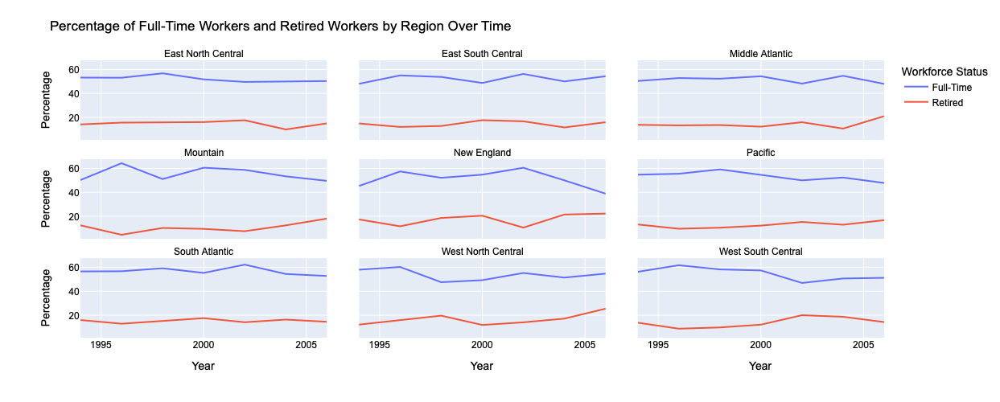

In [22]:
#Creare una nuova colonna 'is_retired' che è 1 se 'workstat' è 'retired', altrimenti 0
df['is_retired'] = df['workstat'].apply(lambda x: 1 if x == 'Retired' else 0)

df_grouped_retired = df.groupby(['year', 'region'])['is_retired'].mean().reset_index()
df_grouped_retired['Retired'] = df_grouped_retired['is_retired'] * 100  # Convertire in percentuale

#Unire i due dataframe
df_merged = pd.merge(df_grouped, df_grouped_retired, on=['year', 'region'])

#Creare un grafico a linee con faccette divise per regione
fig = px.line(df_merged, x='year', y=['Full-Time', 'Retired'], facet_col='region', facet_col_wrap=3, facet_col_spacing=0.04,
              title='Percentage of Full-Time Workers and Retired Workers by Region Over Time', labels={'year':'Year', 'value':'Percentage'})

#Aggiungere spazio tra le faccette
fig.update_layout(
                  autosize=True,
                  margin=dict(t=75,l=100),
                  font=dict(family='Arial', size=12, color='black'),
                  showlegend=True,
                  height=500)

#Rimuovere il prefisso "region = " dalle etichette delle faccette
for annotation in fig['layout']['annotations']: 
    annotation['text'] = annotation['text'].split('=')[1].strip()

fig.layout["legend"]["title"]["text"] = "Workforce Status"

fig.show()

Il grafico mette a confronto l'evoluzione negli anni per ogni regione del numero di individui che lavorano a tempo pieno e dei pensionati. Le due linee in molti casi risultano speculari; dove si osserva un calo dei lavoratori e parallelamente un aumento dei pensionati si può intuire un invecchiamento della popolazione.

# Frequenza ai Servizi Religiosi

I grafici si concentrano ora sull'analisi della frequenza di partecipazione alle cerimonie religiose nel corso degli anni. Si osserva che non ci sono sostanziali variazioni nelle abitudini delle persone nel tempo e nelle diverse regioni.

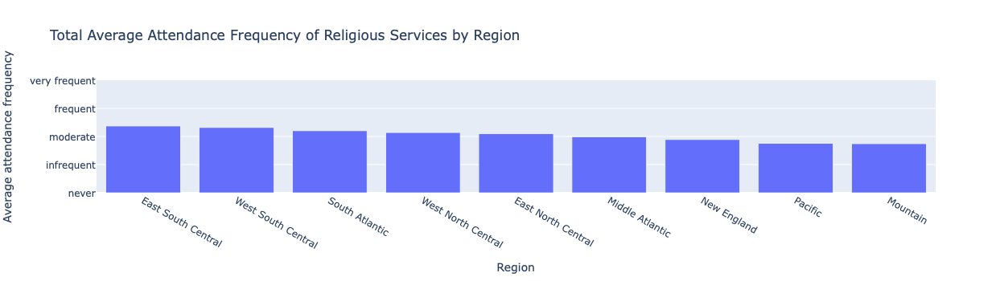

In [23]:
# Comparison of attendance frequency between regions
attend_freq_mapping = {'never': 0, 'infrequent':1, 'moderate':2, 'frequent':3, 'very frequent':4}
df['attend_freq_numeric'] = df['attend_freq'].map(attend_freq_mapping)

# Group by 'year' and calculate the mean of 'attend_numeric'
df_grouped = df.groupby('region')['attend_freq_numeric'].mean().reset_index()


fig = px.bar(df_grouped, x='region', y='attend_freq_numeric', title='Total Average Attendance Frequency of Religious Services by Region')
fig.update_xaxes(title='Region', categoryorder='total descending')
fig.update_yaxes(title='Average attendance frequency', tickvals=[0,1, 2, 3, 4], ticktext=['never', 'infrequent', 'moderate', 'frequent', 'very frequent'], range=[0,4])
fig.update_layout(height=350)
fig.show()


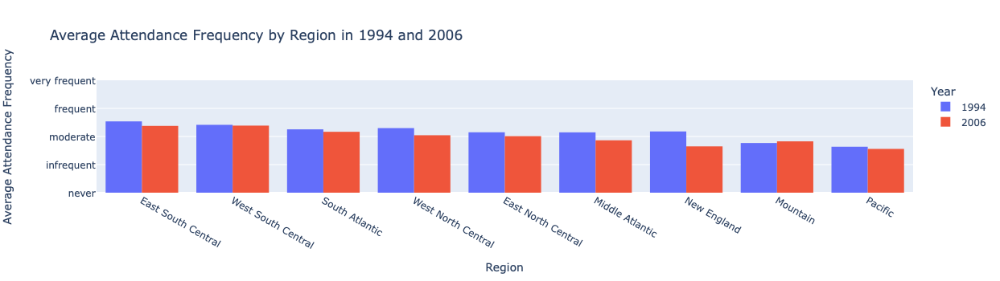

In [24]:
# Comparison of religious attendance frequency in 1994 vs 2006
# Uses mapping of Total Average Attendance Frequency by Region
df_filtered = df[df['year'].isin([1994, 2006])]

# Group by 'year' and 'region', and calculate the mean of 'attend_freq_numeric'
df_grouped = df_filtered.groupby(['year', 'region'])['attend_freq_numeric'].mean().reset_index()

# Create the bar plot
fig = px.histogram(df_grouped, x='region', y='attend_freq_numeric', color='year', barmode='group', title='Average Attendance Frequency by Region in 1994 and 2006')
fig.update_xaxes(title='Region', categoryorder='total descending')
fig.update_yaxes(title='Average Attendance Frequency', tickvals=[0,1, 2, 3, 4], ticktext=['never', 'infrequent', 'moderate', 'frequent', 'very frequent'], range=[0,4])
fig.layout["legend"]["title"]["text"] = "Year"
fig.update_layout(height=350)
fig.show()

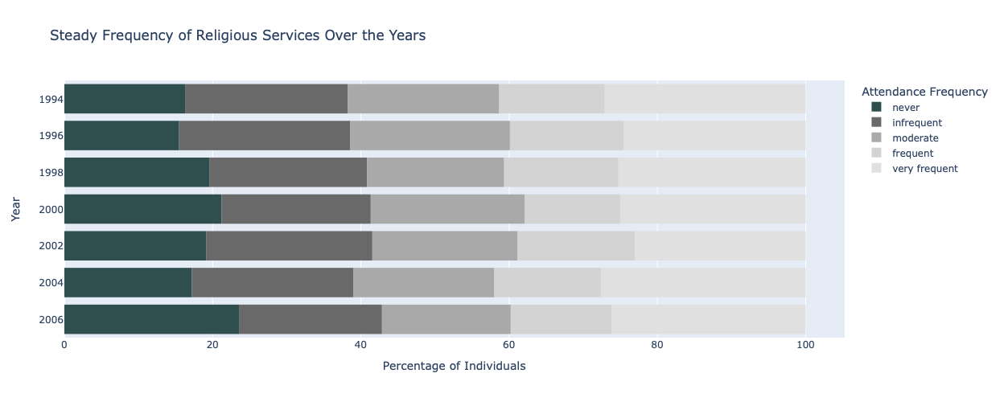

In [25]:
# frequency attendance of religious serveces over the years

df['year_str'] = df['year'].astype(str)
t = df.groupby(["year","attend_freq"]).size().unstack()

attend_order = ['never', 'infrequent', 'moderate', 'frequent', 'very frequent']
gray_scale = ['#2F4F4F', '#696969', '#A9A9A9', '#D3D3D3', '#E0E0E0']

fig = px.histogram(df, orientation="h", y="year_str", color="attend_freq", barmode="relative", barnorm="percent", category_orders={'attend_freq':attend_order},  title="Steady Frequency of Religious Services Over the Years", color_discrete_sequence=gray_scale)

fig.layout["yaxis"]["title"] = "Year"
fig.layout["xaxis"]["title"]="Percentage of Individuals"
fig.layout["yaxis"]["autorange"] = "reversed" 
fig.layout["legend"]["title"]["text"] = "Attendance Frequency"
fig.update_layout(width=1000, height=500)
fig.show()

# Etnia, Lavoro e Reddito

In questa sezione ci si propone di espolare un'eventuale influenza dell'appartenenza a una delle due etnie rappresentate nel dataset sul prestigio occupazionale, sull'educazione e sul reddito.

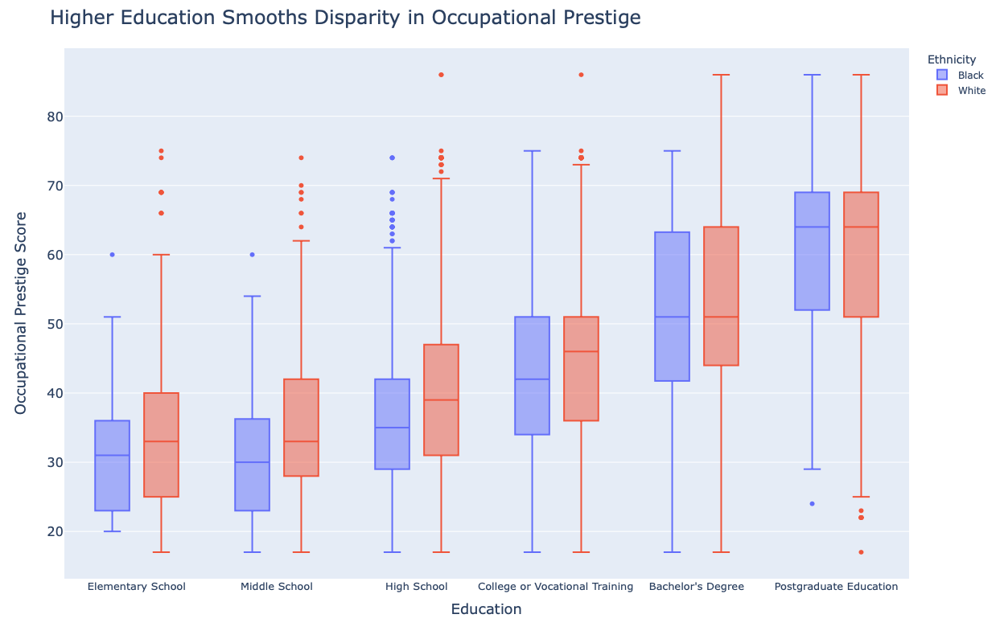

In [26]:
# Analysis of prestige vs education column, comparison of white vs black
df_ie = df.dropna(subset=['prestige', 'education_group'])

fig = px.box(df_ie, x='education_group', y='prestige', color="ethnicity", category_orders={'education_group':group_names}, width = 1200, height= 800)
fig.update_xaxes(title='Education')
fig.update_yaxes(title='Occupational Prestige Score')
fig.layout["legend"]["title"]["text"] = "Ethnicity"
fig.update_layout(
    title=dict(
        text='Higher Education Smooths Disparity in Occupational Prestige',
        font=dict(size=24)  # Change the title font size here
    ),
    legend_title_text='Ethnicity'
)

fig.update_yaxes(
    title_font=dict(size=18),  
    tickfont=dict(size=16),  
)

fig.update_xaxes(
    title_font=dict(size=18),  
    tickfont=dict(size=13), 
)

fig.show()

Il grafico mostra il prestigio occupazionale in relazione al livello di educazione raggiunto. Si può osservare che il prestigio sale più il livello di educazione raggiunto è alto. 

Mettendo a confronto il gruppo etnico degli afroamericani e quello di origine bianca, a parità di livello di educazione si notano delle ineguaglianze a sfavore degli afroamericani nei livelli di educazione più bassi, mentre questa disparità sparisce salendo nell’educazione Bachelor e Postgraduate.  


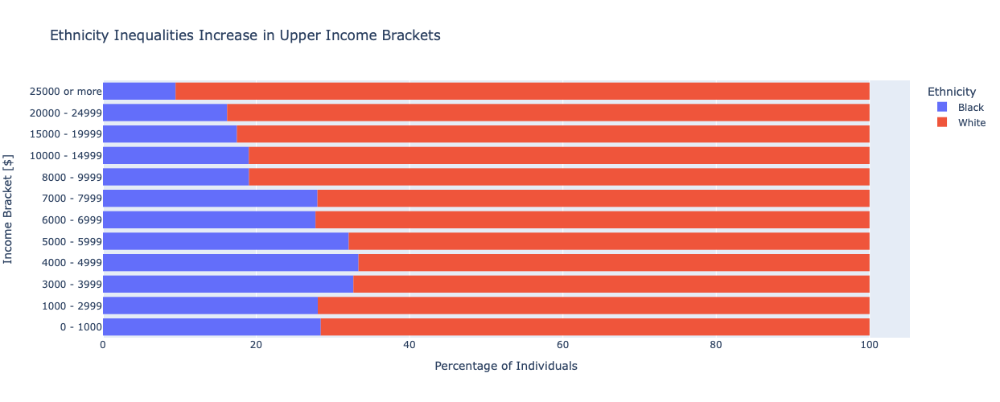

In [27]:
## "Income vs Ethnicity"
income_order = ['0 - 1000', '1000 - 2999', '3000 - 3999', '4000 - 4999', '5000 - 5999', '6000 - 6999', '7000 - 7999', '8000 - 9999', '10000 - 14999', '15000 - 19999', '20000 - 24999', '25000 or more']
income_order.reverse()

t = df.groupby(["income","ethnicity"]).size().unstack()

fig = px.histogram(df, orientation="h", y="income", color="ethnicity", 
                   barmode="relative", barnorm="percent", 
                   category_orders={"income": income_order}, 
                   title="Ethnicity Inequalities Increase in Upper Income Brackets")
fig.update_layout(xaxis_title="Percentage of Individuals", 
                  width=800, height=500)
fig.update_yaxes(title='Income Bracket [$]')
fig.layout["legend"]["title"]["text"] = "Ethnicity"
fig.show()


Si vede qui rappresentata la percentuale di individui di entia bianca e nera nelle diverse fasce di reddito. Più si sale nelle fasce alte, più la percentuale di individui afroamericani diminuisce e le differenze tra i due gruppi si accentuano.

## Famiglia e Tempo Libero

Si proseguono le analisi esaminando due variabili relative alla sfera familiare e alle attività di svago.

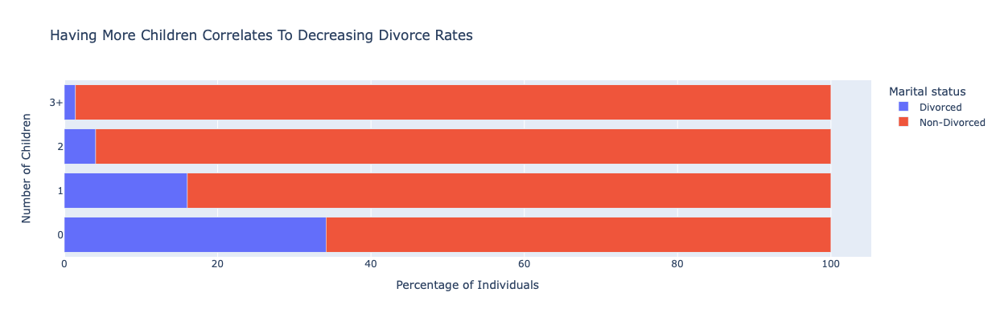

In [28]:
#Convert the 'divorce' column to numerical values (0 = no, 1 = yes)
df['divorce_str'] = df['divorce'].map({'no': 0, 'yes': 1})

#Remove rows with missing data in 'divorce' and 'babies'
t = df.dropna(subset=['divorce_str', 'babies', 'preteen', 'teens']).copy()
t.loc[:,'totalNoOfChildren'] = t['babies'] + t['preteen'] + t['teens']

#Calculate the total number of people for each number of children
total_count = t['totalNoOfChildren'].value_counts()
total_count.index = pd.cut(total_count.index, bins=[-1, 0, 1, 2, float('inf')],
                            labels=['0', '1', '2', '3+'])
total_count = total_count.groupby(total_count.index, observed=False).sum()

#Calculate the number of divorced individuals for each number of children
divorced_count = t[t['divorce_str'] == 1]['babies'].value_counts()
divorced_count.index = pd.cut(divorced_count.index, bins=[-1, 0, 1, 2, float('inf')],
                            labels=['0', '1', '2', '3+'])
divorced_count = divorced_count.groupby(divorced_count.index, observed=False).sum()

#Calculate the percentage of divorced individuals for each number of children
percentage = (divorced_count / total_count) * 100

#Replace NaN values with zero
percentage = percentage.fillna(0)

#Create a DataFrame for the stacked bar chart
results = pd.DataFrame({
    'babies': percentage.index,
    'Divorced': percentage.values,
    'Non-Divorced': 100 - percentage.values
})

#Create the stacked bar chart with inverted axes and rotated bars
fig = px.bar(results, y='babies', x=['Divorced', 'Non-Divorced'],
             barmode='relative', orientation='h', title="Having More Children Correlates To Decreasing Divorce Rates")
fig.update_layout(width=900, height=400, yaxis_title='Number of Children', xaxis_title='Percentage of Individuals')

fig.layout["legend"]["title"]["text"] = "Marital status"
fig.show()

Riguardo l'ambito famigliare, si esplora la relazione tra il numero di figli e di indivui divorziati. In questa analisi sono stati presi in considerazione individui con figli fino all’età di 18 anni. Ogni riga rappresenta la percentuale di persone divorziate e non divorziate per numero di figli. 

Osserviamo che la percentuale di divorzi cala drasticamente all’aumentare del numero di figli. Questo lascia suggerire che le coppie senza figli tendono a divorziare più facilmente 


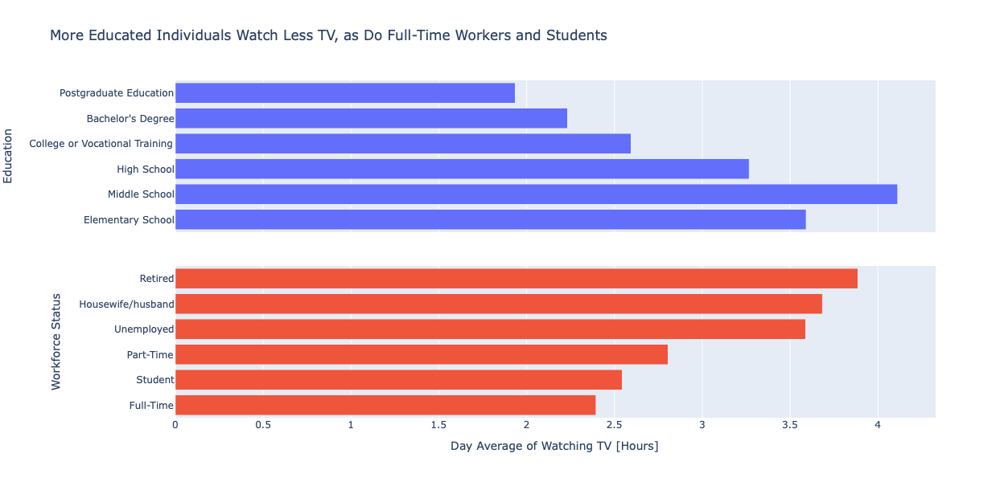

In [29]:
# More Educated Individuals Watch Less TV, as Do Full-Time Workers and Students
from plotly.subplots import make_subplots

fig = make_subplots(rows=2, cols=1, vertical_spacing=0.1, shared_xaxes=True) 

# 1. Average Hours per Day Watching TV per Education Group
media = df.groupby('education_group', observed=False)['tvhours'].mean()
df_media = media.reset_index(name='media_tvhours')
fig.add_trace(go.Bar(y=df_media['education_group'], x=df_media['media_tvhours'], orientation='h', name='Education'), row=1, col=1)


# 2. Average Hours per Day Watching TV per Workforce Status 
# Filter out the "other" answer from the workforce status
df_filtered = df.loc[df['workstat'] != 'Other']

media = df_filtered.groupby('workstat')['tvhours'].mean()

df_media = media.reset_index(name='media_tvhours')
df_media = df_media.sort_values('media_tvhours')
fig.add_trace(go.Bar(y=df_media['workstat'], x=df_media['media_tvhours'], orientation='h', name='Workforce Status'), row=2, col=1)

# Update layout
fig.update_layout(height=600, width=1000,showlegend=False, title_text="More Educated Individuals Watch Less TV, as Do Full-Time Workers and Students")
fig.update_yaxes(title_text='Education', row=1, col=1)
fig.update_yaxes(title_text='Workforce Status', row=2, col=1)
fig.update_xaxes(title_text='Day Average of Watching TV [Hours]', row=2, col=1)
fig.show()


Il grafico blu mostra quante ore in media le persone guardano la TV, suddivise per livello di educazione. Si osserva che più si sale di livello nell’educazione raggiunta, meno la gente tende a guardare la TV.

Se invece si suddividono nel grafico rosso gli individui in base al loro statuto lavorativo, si nota che le persone che hanno più tempo libero, come i pensionati, i casalinghi e i disoccupati, tendono a guardare più ore di TV.


# Cosa Rende più Felici?

In generale, il livello medio di felicità dichiarato dalle persone é rimasto stabile nel corso degli anni, così come la percentuale di individui che dichiarano di essere molto felici. Vengono proposte di seguito una serie di analisi sul grado di felicità percepito dalle persone in relazione a diverse variabili. 

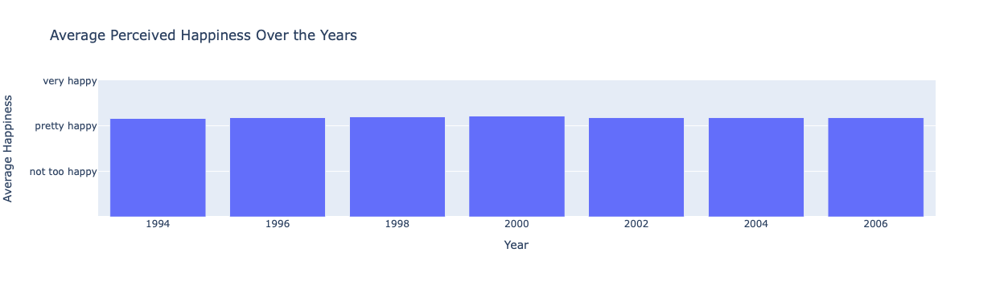

In [30]:
# Calculate the "average" of the happiness
happiness_mapping = {'not too happy': 1, 'pretty happy': 2, 'very happy': 3}
df['happy_numeric'] = df['happy'].map(happiness_mapping)
df_grouped = df.groupby('year')['happy_numeric'].mean().reset_index()
#print(df_grouped)
average_happiness = df['happy_numeric'].mean() # Not used here

fig = px.bar(df_grouped, x='year', y='happy_numeric', title='Average Perceived Happiness Over the Years')
fig.update_xaxes(title='Year')
fig.update_yaxes(title='Average Happiness', tickvals=[1, 2, 3], ticktext=['not too happy', 'pretty happy', 'very happy'], range=[0,3])
fig.update_layout(height=350)
fig.show()

# Oppure fare grafico come per income vs happiness con anni sull'asse y

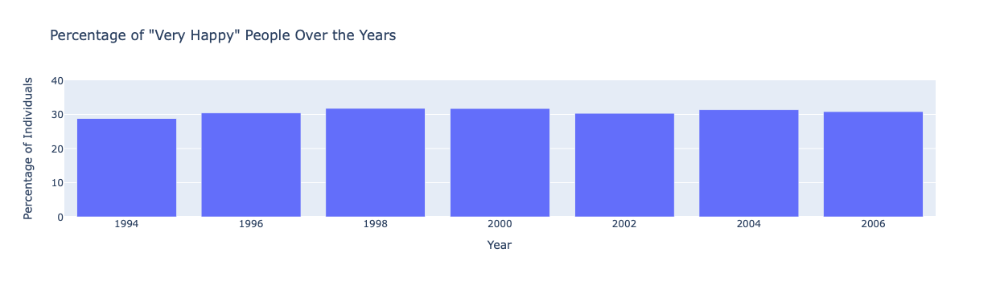

In [31]:
# Calculate the percentace of "very happy" people 
df['is_very_happy'] = df['happy'] == 'very happy'

# Group by year and calculate the mean
df_grouped = df.groupby('year')['is_very_happy'].mean().reset_index()
df_grouped['is_very_happy'] *= 100

# Plot the data
fig = px.bar(df_grouped, x='year', y='is_very_happy', title='Percentage of "Very Happy" People Over the Years', height=400)
fig.update_xaxes(title='Year')
fig.update_yaxes(title='Percentage of Individuals', range=[0,40])
fig.update_layout(height=350)
fig.show()

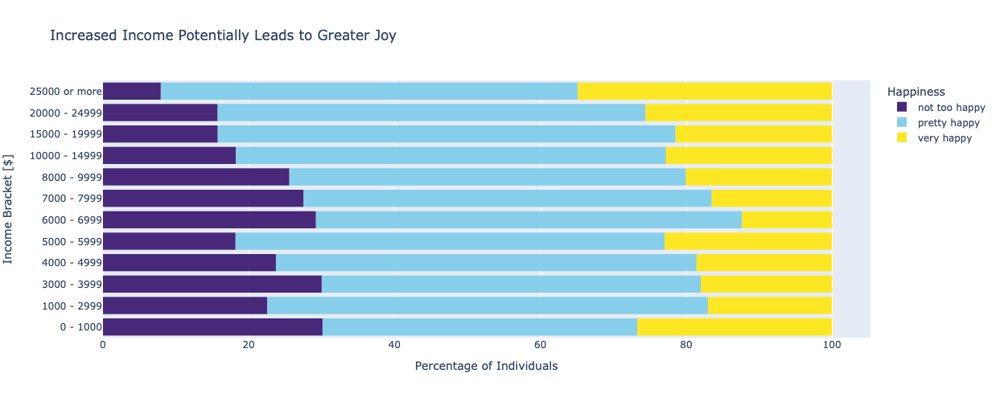

In [32]:
# Income vs Happiness
income_order = ['0 - 1000', '1000 - 2999', '3000 - 3999', '4000 - 4999', '5000 - 5999', '6000 - 6999', '7000 - 7999', '8000 - 9999', '10000 - 14999', '15000 - 19999', '20000 - 24999', '25000 or more']
happy_order = ['not too happy', 'pretty happy', 'very happy']


fig = px.histogram(df, orientation="h", y="income", color="happy", barmode="relative", barnorm="percent", category_orders={"income": income_order, 'happy':happy_order}, color_discrete_map={'not too happy': '#482878', 'pretty happy': '#87CEEB', 'very happy': '#fde725'}, title="Increased Income Potentially Leads to Greater Joy")


fig.layout["yaxis"]["title"] = "Income Bracket [$]"
fig.layout["xaxis"]["title"]="Percentage of Individuals"
fig.layout["yaxis"]["autorange"] = "reversed"  # This line inverts the order of the y-axis
fig.layout["legend"]["title"]["text"] = "Happiness"
fig.update_layout(width=1000, height=500)
fig.show()

Mettendo il relazione il grado di felicità percepito da un individuo e la fascia di reddito in cui si trova, si osserva che la percentuale di persone felici aumenta insieme all’aumentare del reddito, lasciando suggerire che effettivamente avere più disponibilità economica può contribuire alla sensazione di essere felici.

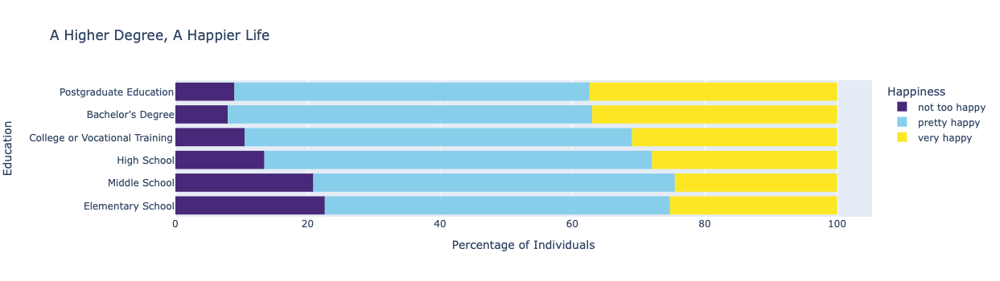

In [33]:
# Education vs Happiness
happy_order = ['not too happy', 'pretty happy', 'very happy']

fig = px.histogram(df, orientation="h", y="education_group", color="happy", barmode="relative", barnorm="percent", category_orders={"education_group": group_names, 'happy':happy_order}, color_discrete_map={'not too happy': '#482878', 'pretty happy': '#87CEEB', 'very happy': '#fde725'}, title="A Higher Degree, A Happier Life")

fig.layout["yaxis"]["title"] = "Education"
fig.layout["xaxis"]["title"]="Percentage of Individuals"
fig.layout["yaxis"]["autorange"] = "reversed"  # This line inverts the order of the y-axis
fig.layout["legend"]["title"]["text"] = "Happiness"
fig.update_layout(width=1000, height=350)
fig.show()

Questo grafico suggerisce che raggiungere un livello di istruzione alto possa contribuire ad una percezione di maggiore felicità. Questa riflessione si collega alle analisi precedenti, dove é stato osservato che il livello di istruzione é positivamente correlato reddito, e il reddito al grado di felicità.

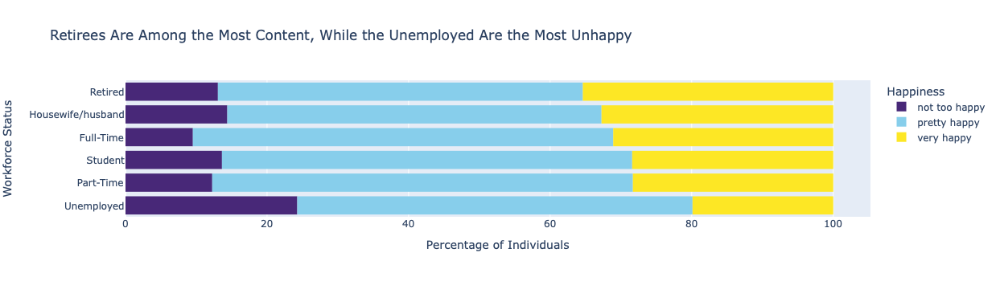

In [34]:
#Workforce Status vs Happiness
df_filtered = df.loc[df['workstat'] != 'Other']
t = df_filtered.groupby(["workstat","happy"]).size().unstack()
sorted_status = (t.loc[:,"very happy"] / t.sum(axis=1)).sort_values().index

happy_order = ['not too happy', 'pretty happy', 'very happy']

fig = px.histogram(df_filtered, orientation="h", y="workstat", color="happy", barmode="relative", barnorm="percent", category_orders={'happy':happy_order, 'workstat':sorted_status}, color_discrete_map={'not too happy': '#482878', 'pretty happy': '#87CEEB', 'very happy': '#fde725'}, title="Retirees Are Among the Most Content, While the Unemployed Are the Most Unhappy")

fig.layout["yaxis"]["title"] = "Workforce Status"
fig.layout["xaxis"]["title"]="Percentage of Individuals"
fig.layout["yaxis"]["autorange"] = "reversed"
fig.layout["legend"]["title"]["text"] = "Happiness"
fig.update_layout(width=1000, height=350)
fig.show()

Si osserva che i pensionati sono tra il gruppo di persone maggiormente felici, mentre, non soprendentemente, le persone senza impiego sono quelle che hanno dichiarato più spesso di essere non contente.

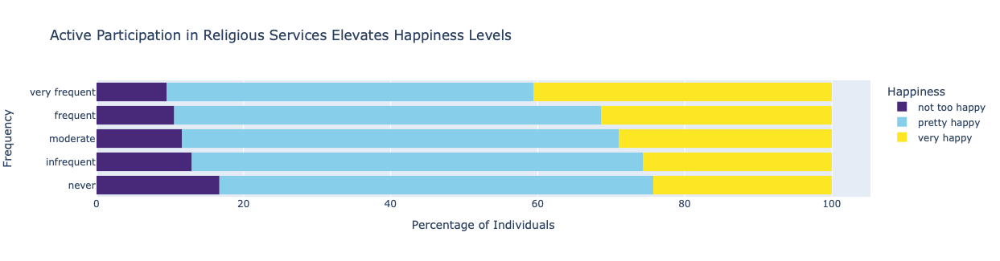

In [35]:
# Attendance frequency vs Happiness
happy_order = ['not too happy', 'pretty happy', 'very happy']
attend_order = ['never', 'infrequent', 'moderate', 'frequent', 'very frequent']

fig = px.histogram(df, orientation="h", y="attend_freq", color="happy", barmode="relative", barnorm="percent", category_orders={"attend_freq": attend_order, 'happy':happy_order}, color_discrete_map={'not too happy': '#482878', 'pretty happy': '#87CEEB', 'very happy': '#fde725'}, title="Active Participation in Religious Services Elevates Happiness Levels")

fig.layout["yaxis"]["title"] = "Frequency"
fig.layout["xaxis"]["title"]="Percentage of Individuals"
fig.layout["yaxis"]["autorange"] = "reversed"  # This line inverts the order of the y-axis
fig.layout["legend"]["title"]["text"] = "Happiness"
fig.update_layout(width=1000, height=325)
fig.show()

Riguardo le abitudini religiose, questo grafico lascia intuire che più un individio frequenta con assiduità i servizi religiosi più tende ad essere felice. 

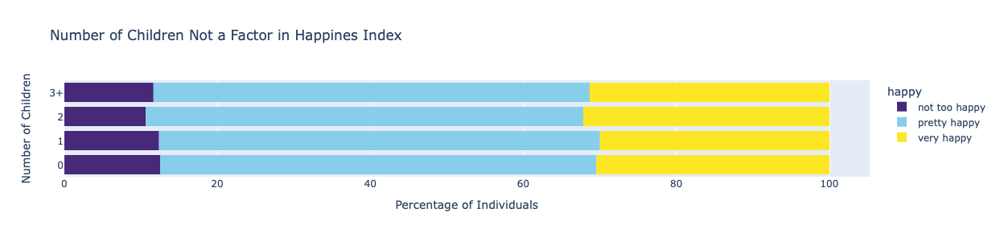

In [36]:
#Number of children and Happiness
#Remove rows with missing data in 'happy', 'babies', 'preteen', 'teens'
t = df.dropna(subset=['happy', 'babies', 'preteen', 'teens']).copy()

#Calculate the total number of children and limit it to 3
t.loc[:,'totalNoOfChildren'] = t['babies'] + t['preteen'] + t['teens']
t.loc[:,'totalNoOfChildren'] = t['totalNoOfChildren'].apply(lambda x: '3+' if x >= 3 else str(int(x)))
t.loc[:,'happy'] = df['happy']

fig = px.histogram(t, orientation="h", y='totalNoOfChildren', color="happy", barmode="relative", barnorm="percent", 
                   category_orders={'happy': ['not too happy', 'pretty happy', 'very happy']}, 
                   color_discrete_map={'not too happy': '#482878', 'pretty happy': '#87CEEB', 'very happy': '#fde725'}, 
                   title="Number of Children Not a Factor in Happines Index")

fig.update_yaxes(categoryorder='array', categoryarray=sorted(t['totalNoOfChildren'].unique()))
fig.layout["yaxis"]["title"] = "Number of Children"
fig.layout["xaxis"]["title"]="Percentage of Individuals"
fig.update_layout(width=1000, height=300)

fig.show()

Da ultimo, si può dedurre che avere figli o meno non ha una grande influenza sul grado di felicità percepito.

# Conclusioni

Infine si analizza qual'è la correlazione tra alcuni fattori, quali ore di lavoro, prestigio lavorativo, livello di educazione, reddito, frequenza alle cerimonie religiose, ore passate guardando la TV e felicità. 

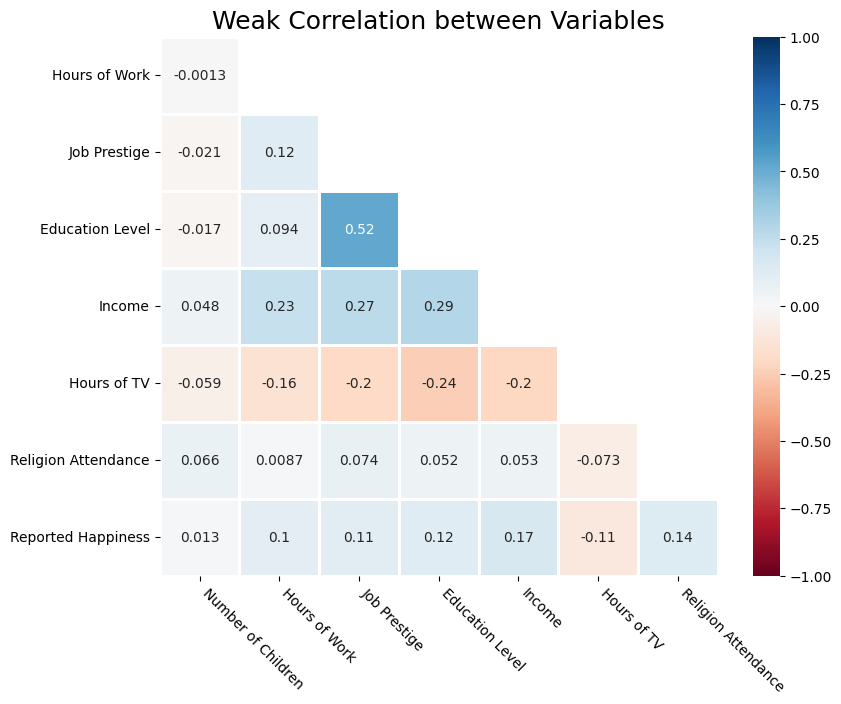

In [37]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculating the correlation between columns
happy_mapping = {'pretty happy': 1, 'very happy': 2, 'not too happy': 0}
happiness = df['happy'].map(happy_mapping)

# Other vars to set up columns
income_order = ['0 - 1000', '1000 - 2999', '3000 - 3999', '4000 - 4999', '5000 - 5999', '6000 - 6999', '7000 - 7999', '8000 - 9999', '10000 - 14999', '15000 - 19999', '20000 - 24999', '25000 or more']
income_mapping = {category: index for index, category in enumerate(income_order)}

workstat_order = ['Unemployed', 'Part-Time', 'Full-Time']
workstat_mapping = {category: index for index, category in enumerate(workstat_order)}

religion_order = ['never', 'less than once a year', 'once a year', 'several times a year', 'once a month', '2-3 times a month', 'nearly every week', 'every week', 'more than once a week']
religion_mapping = {category: index for index, category in enumerate(religion_order)}

# Setting up columns
children = df[['babies', 'preteen', 'teens']].sum(axis=1)
workstat = df[df['workstat'].isin(workstat_order)]['workstat'].map(workstat_mapping)
prestige = df['prestige'].dropna()
education = df['educ'].dropna()
income = df['income'].map(income_mapping).dropna()
tv_hours = df['tvhours'].dropna()
religion_attendance = df[df['attend'].isin(religion_order)]['attend'].map(religion_mapping)

# Crea un DataFrame dai tuoi array
data = {
    'Number of Children': children,
    'Hours of Work': workstat,
    'Job Prestige': prestige,
    'Education Level': education,
    'Income': income,
    'Hours of TV': tv_hours,
    'Religion Attendance': religion_attendance,
    'Reported Happiness': happiness
}

new_df = pd.DataFrame(data)

#Calcola la matrice di correlazione
correlation_matrix = new_df.corr()

#Rimuovi la prima riga
matrix_to_display = correlation_matrix.iloc[1:]

#Rimuovi l'ultima colonna
matrix_to_display = matrix_to_display.iloc[:, :-1]

#Getting the Upper Triangle of the co-relation matrix
upper_matrix = np.triu(matrix_to_display, k=1)

#Plotting the heatmap with gray borders
plt.figure(figsize=(9, 7))
sns.heatmap(matrix_to_display, cmap='RdBu', vmin=-1, vmax=1, annot=True, mask=upper_matrix, linewidths=2)
plt.xticks(rotation=-45, ha='left')
plt.title("Weak Correlation between Variables", size=18)
plt.show()


I fattori sono rappresentati sugli assi, mentre il valore nella cella è l’indice di correlazione, che indica la forza della correlazione tra i due fattori in questione. Il colore della cella tende ad essere intenso all’aumentare dell’indice di correlazione verso gli estremi. 

Notiamo che il grafico presenta dei colori tenui, perciò si può dedurre che in generale c’è una debole correlazione tra i fattori presi in considerazione. Tra tutte risalta la casella che correla il livello di istruzione al prestigio lavorativo, con un valore di 0.52.

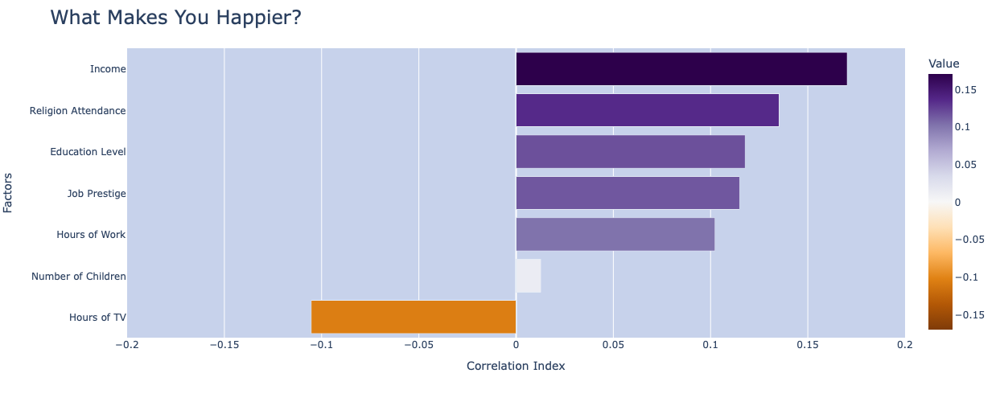

In [38]:
#Extracting correlations with 'Happy'
happy_correlations = correlation_matrix['Reported Happiness']
happy_correlations = happy_correlations.drop('Reported Happiness')

#Creating a DataFrame with the correlations
correlations = pd.DataFrame({
    'Variable': happy_correlations.index,
    'Value': happy_correlations.values
})

#Sorting DataFrame by 'Correlation with Happy' in descending order
correlations = correlations.sort_values(by='Value', ascending=False)

#Resetting the index
correlations = correlations.reset_index(drop=True)

#Create a bar chart
fig = px.bar(correlations, y='Variable', x='Value', height=500, color='Value',
             color_continuous_scale='PuOr', color_continuous_midpoint=0)

fig.update_layout(
   plot_bgcolor='rgba(199,210,235,255)',
        title=dict(
        text='What Makes You Happier?',
        font=dict(size=24)  # Change the title font size here
    )
)

#Update x-axis range
fig.update_xaxes(range=[-0.2, 0.2], title_text='Correlation Index')
fig.update_yaxes(categoryorder='total ascending', title_text='Factors')
fig.show()

In dettaglio, si rappresenta la correlazione tra i diversi fattori visti in precedenza e il livello di felicità riportato dai partecipanti. Le correlazioni esistono ma sono piuttosto deboli: i valori infatti oscillano tra -0,11 e 0,17. Tuttavia si può notare quali sono i fattori che più si correlano positivamente con la felicità, quali reddito e frequenza ai servizi religiosi, mentre le ore passate davanti alla TV sono l’unico fattore con correlazione negativa.